# ${\textbf{G3: Investigate elementwisely the colocs for N >= 500}}$  
In this notebook, we go over each SWOT-S1 co-located case with a significant number of co-located points, and we display:  
1. SARWAVE's $H_s$
2. KaRIn's $H_s$
3. Difference between (2) and (1)
4. Normalized cross-section $\sigma _0$
5. A scatterplot of SARWAVE's $H_s$ vs KaRIn's $H_s$, with fixed limits to allow comparison between cases.  
  
$\textbf{WARNING:}$ Please note that the $H_s$, $\sigma _0$ and Counts colorbar change from one case to another, as it is complicated to define one that suits every case.  

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import SWOT_tools as st
import xarray as xr
import shapefile as shp 
import os
from datetime import datetime
from tqdm import tqdm
from scipy.interpolate import griddata
from scipy.ndimage import binary_dilation

from time import time
import pandas as pd

In [2]:
import matplotlib.font_manager as fm
# Regular and bold font paths
font_regular_path = "fonts/times/times.ttf"
font_bold_path = "fonts/times/timesbd.ttf"  # Bold
# Register both fonts
fm.fontManager.addfont(font_regular_path)
fm.fontManager.addfont(font_bold_path)
# Create font properties
font_regular = fm.FontProperties(fname=font_regular_path)
font_bold = fm.FontProperties(fname=font_bold_path)
# Set default font to regular Times New Roman
plt.rcParams['font.family'] = font_regular.get_name()

In [3]:
def hand_back_times_from_IW_filepath(iw_filepath):
    import os
    iw_filename = os.path.basename(iw_filepath)
    str_ini = iw_filename[18:33]
    str_end = iw_filename[34:49]
    return str_ini, str_end

  0%|          | 0/170 [00:00<?, ?it/s]

lon_map_min = 4.670736; lon_map_max = 14.38269; lat_map_min = 70.53521, lat_map_max = 74.155624


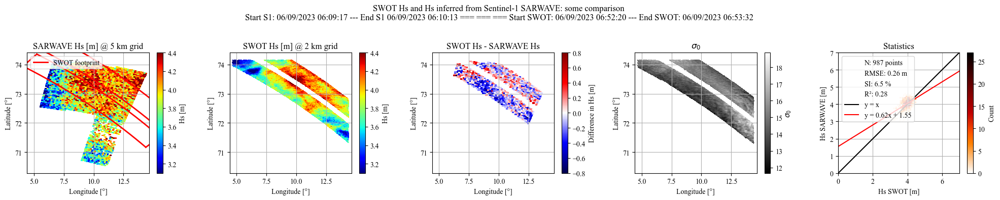

  1%|          | 2/170 [01:15<1:45:04, 37.53s/it]

lon_map_min = 29.411203; lon_map_max = 33.36728; lat_map_min = -34.68095, lat_map_max = -29.41768


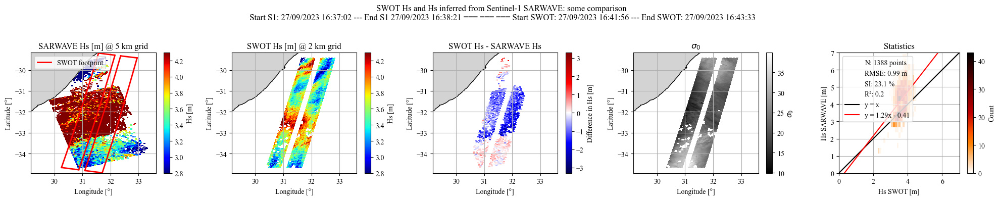

  5%|▍         | 8/170 [02:31<47:10, 17.47s/it]  

lon_map_min = -0.9252394; lon_map_max = 4.7182374; lat_map_min = 55.88145, lat_map_max = 60.734238


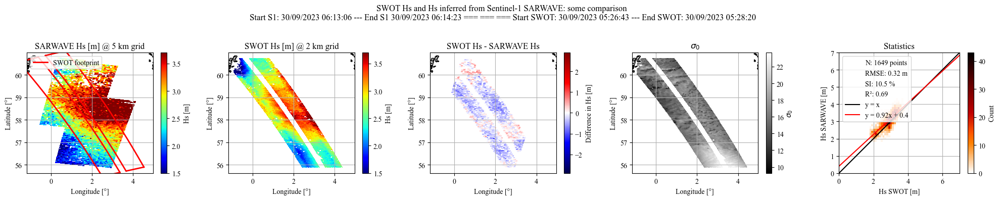

  5%|▌         | 9/170 [03:47<1:12:19, 26.96s/it]

lon_map_min = 26.89364; lon_map_max = 29.83873; lat_map_min = 33.37274, lat_map_max = 35.103786


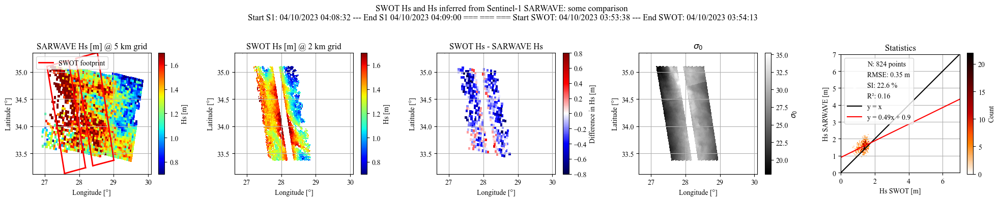

  7%|▋         | 12/170 [05:01<1:08:27, 26.00s/it]

lon_map_min = -5.565322; lon_map_max = 1.6568643; lat_map_min = 57.94508, lat_map_max = 65.162445


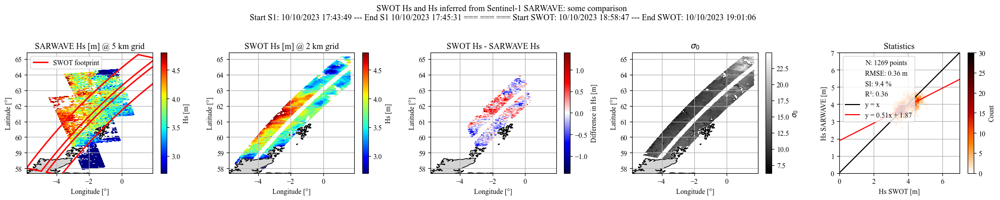

  8%|▊         | 13/170 [06:19<1:30:14, 34.49s/it]

lon_map_min = -0.6701059; lon_map_max = 26.979012; lat_map_min = 63.804615, lat_map_max = 75.08183


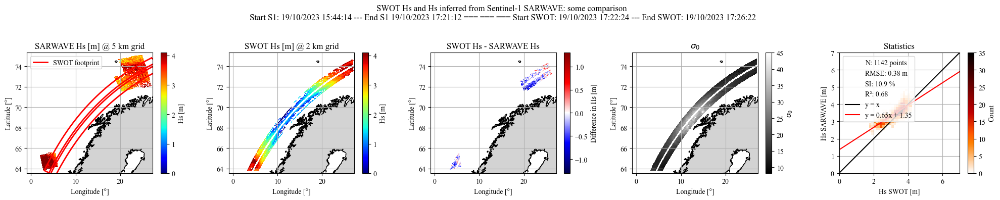

  9%|▉         | 15/170 [07:40<1:33:46, 36.30s/it]

lon_map_min = 9.245238; lon_map_max = 17.958168; lat_map_min = 69.31394, lat_map_max = 72.657234


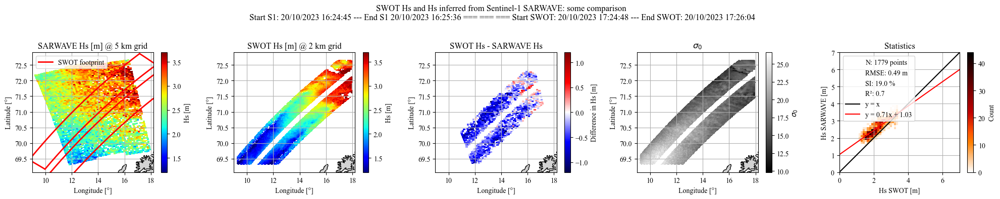

  9%|▉         | 16/170 [08:55<1:51:46, 43.55s/it]

lon_map_min = 2.888473; lon_map_max = 9.759474; lat_map_min = 64.63372, lat_map_max = 67.93631


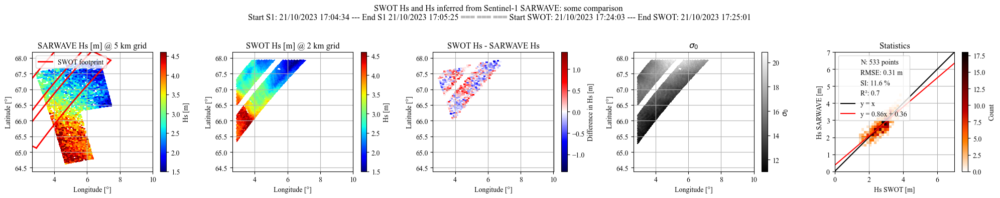

 10%|█         | 17/170 [10:09<2:07:24, 49.97s/it]

lon_map_min = 4.6670537; lon_map_max = 14.37902; lat_map_min = 70.53491, lat_map_max = 74.154976


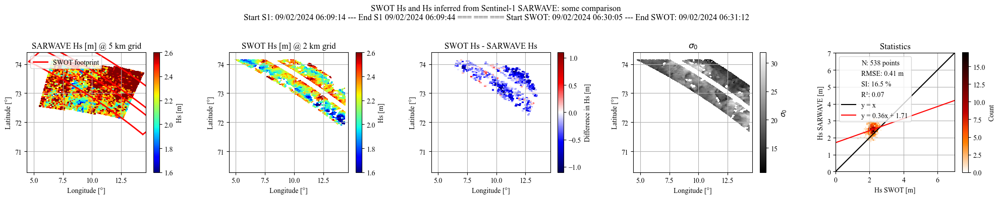

 14%|█▍        | 24/170 [11:24<56:48, 23.35s/it]  

lon_map_min = 3.9446185; lon_map_max = 13.02078; lat_map_min = 64.596214, lat_map_max = 70.93991


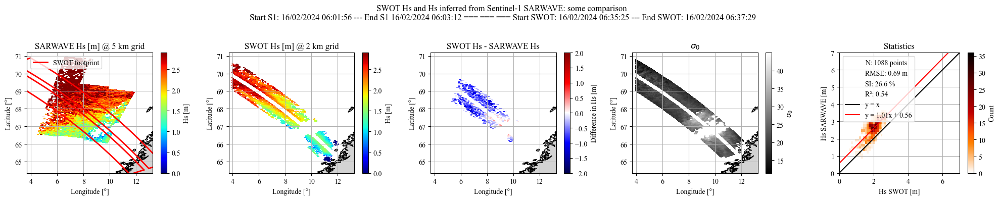

 16%|█▌        | 27/170 [12:41<57:17, 24.03s/it]

lon_map_min = -2.2386396; lon_map_max = 6.965915; lat_map_min = 64.56773, lat_map_max = 70.91229


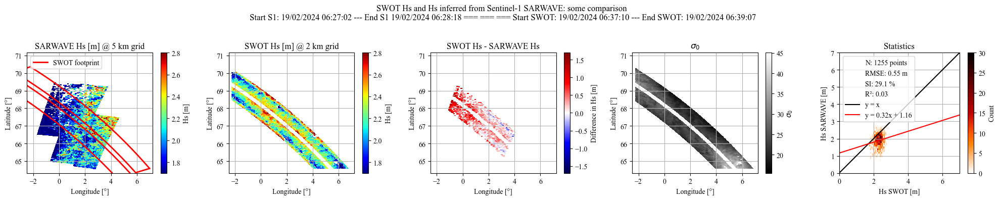

 17%|█▋        | 29/170 [13:58<1:03:58, 27.23s/it]

lon_map_min = -0.07277027; lon_map_max = 6.945153; lat_map_min = 58.835644, lat_map_max = 65.168434


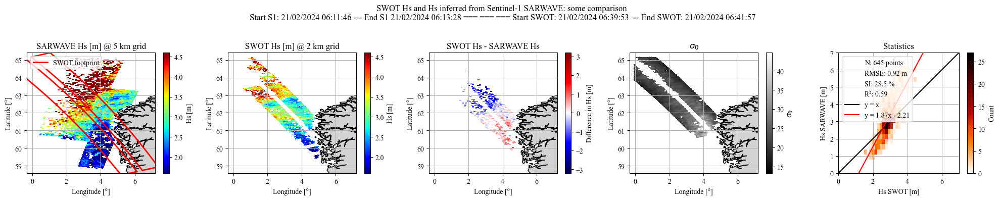

 18%|█▊        | 30/170 [15:16<1:19:27, 34.06s/it]

lon_map_min = 170.8177; lon_map_max = 174.4162; lat_map_min = -37.628048, lat_map_max = -34.154015


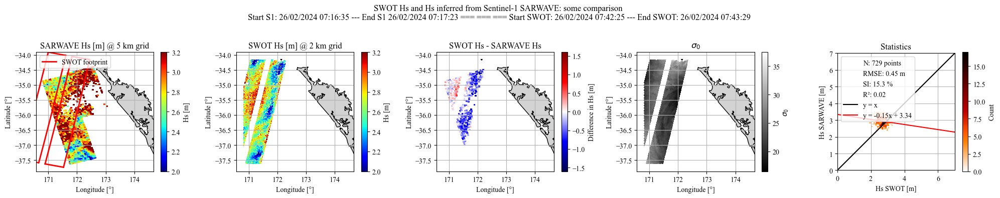

 22%|██▏       | 37/170 [16:31<45:42, 20.62s/it]  

lon_map_min = 164.33391; lon_map_max = 168.81792; lat_map_min = -48.00854, lat_map_max = -44.003147


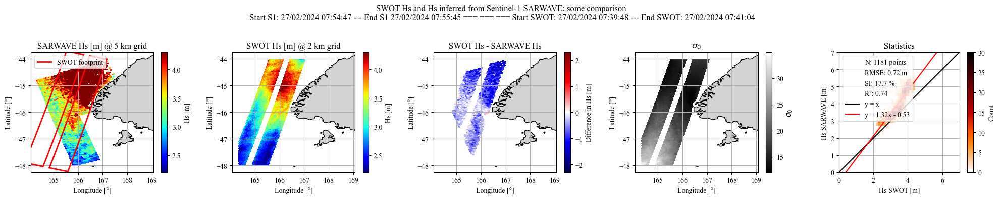

 23%|██▎       | 39/170 [17:46<52:11, 23.91s/it]

lon_map_min = -28.936308; lon_map_max = -25.69382; lat_map_min = 31.928345, lat_map_max = 35.321243


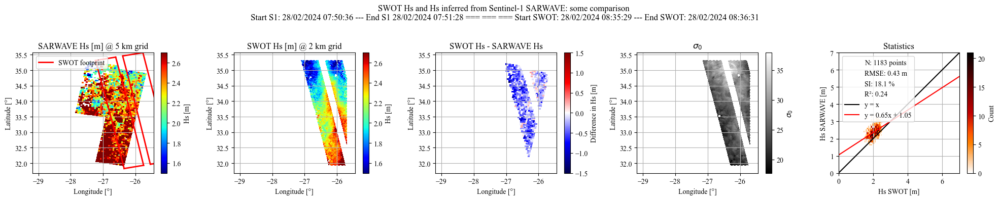

 24%|██▍       | 41/170 [19:04<58:16, 27.10s/it]

lon_map_min = 113.152176; lon_map_max = 116.5427; lat_map_min = -31.11467, lat_map_max = -27.334457


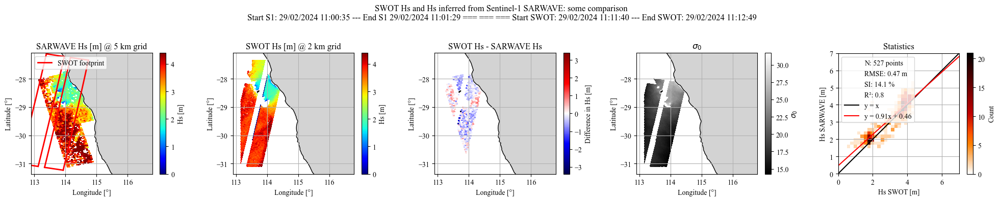

 25%|██▍       | 42/170 [20:21<1:11:45, 33.64s/it]

lon_map_min = 14.6253395; lon_map_max = 19.371254; lat_map_min = 33.584133, lat_map_max = 42.939213


/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:119: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im0 = ax[0].pcolormesh(x_grid, y_grid, hsml_confident, cmap="jet", vmin=hs_min, vmax=hs_max)
/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:160: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im2 = ax[2].pcolormesh(x_grid, y_grid, hs_swot_on_iw-hsml_confident, cmap="seismic", vmin=-diff_max, vmax=diff_max)


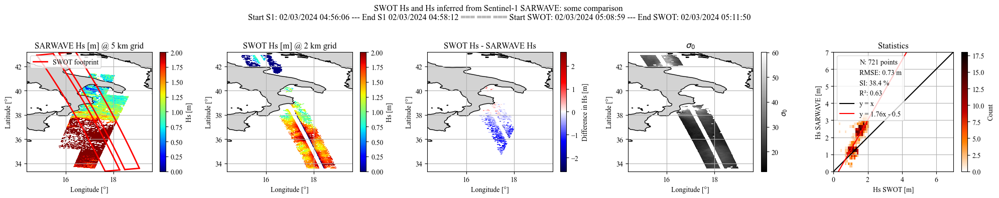

 26%|██▌       | 44/170 [21:41<1:14:18, 35.38s/it]

lon_map_min = -10.129158; lon_map_max = -6.5213137; lat_map_min = 33.24119, lat_map_max = 38.12219


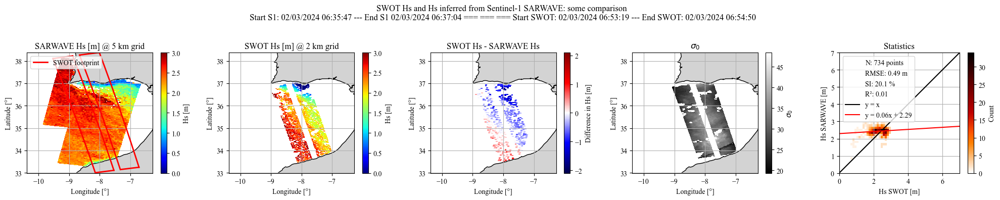

 27%|██▋       | 46/170 [22:58<1:14:59, 36.28s/it]

lon_map_min = -66.93619; lon_map_max = -62.756084; lat_map_min = 13.03475, lat_map_max = 23.024643


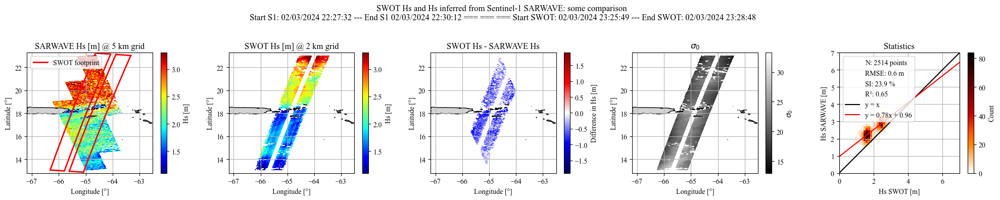

 29%|██▉       | 50/170 [24:26<59:49, 29.91s/it]  

lon_map_min = 110.065094; lon_map_max = 113.005165; lat_map_min = 18.801851, lat_map_max = 22.457193


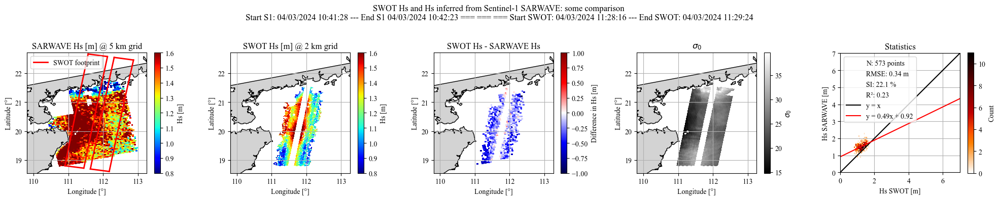

 31%|███       | 52/170 [25:49<1:04:25, 32.76s/it]

lon_map_min = -17.220924; lon_map_max = -12.652796; lat_map_min = 28.555338, lat_map_max = 38.093227


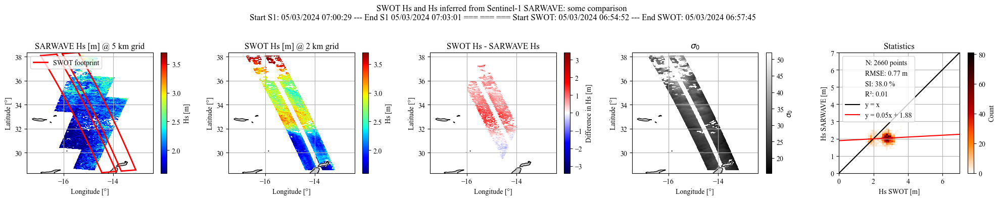

 32%|███▏      | 55/170 [27:11<59:13, 30.90s/it]  

lon_map_min = -117.265366; lon_map_max = -113.89858; lat_map_min = 22.014353, lat_map_max = 27.25774


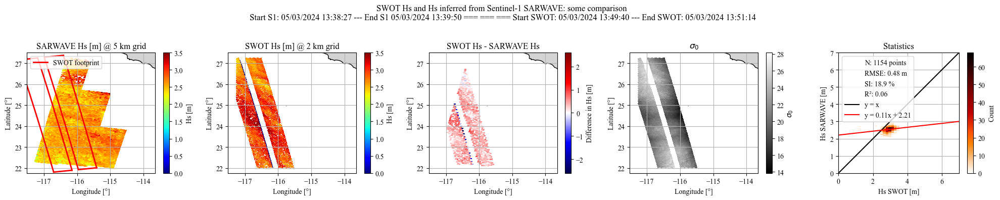

 33%|███▎      | 56/170 [28:28<1:10:59, 37.37s/it]

lon_map_min = -73.44007; lon_map_max = -69.302505; lat_map_min = 36.054615, lat_map_max = 42.319454


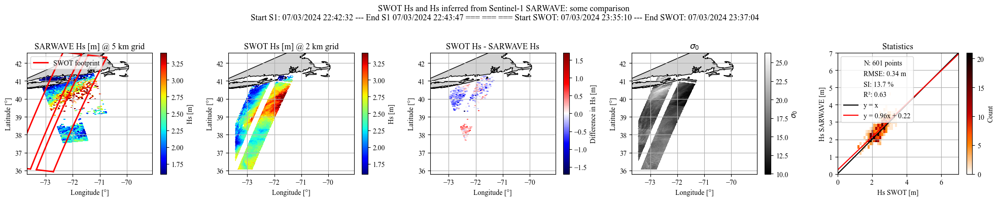

 36%|███▋      | 62/170 [29:46<43:22, 24.10s/it]  

lon_map_min = -29.799213; lon_map_max = -26.082176; lat_map_min = 35.955746, lat_map_max = 40.730785


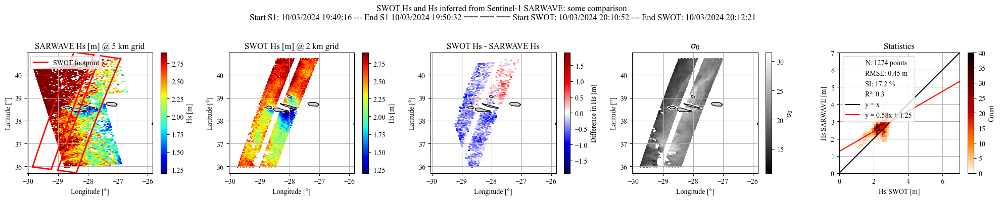

 38%|███▊      | 65/170 [31:05<43:07, 24.64s/it]

lon_map_min = -5.2080975; lon_map_max = 2.0779715; lat_map_min = 56.468296, lat_map_max = 64.341324


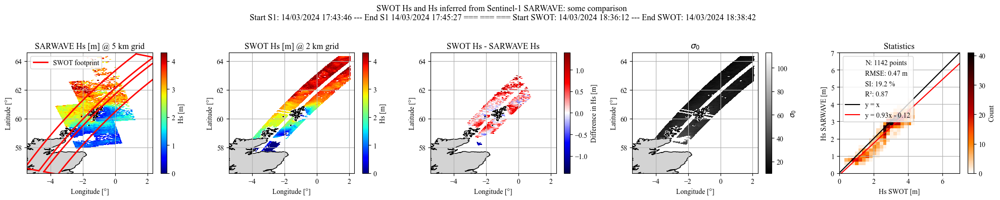

 41%|████      | 69/170 [32:57<43:29, 25.83s/it]

lon_map_min = 149.28433; lon_map_max = 154.1838; lat_map_min = -39.096333, lat_map_max = -32.090904


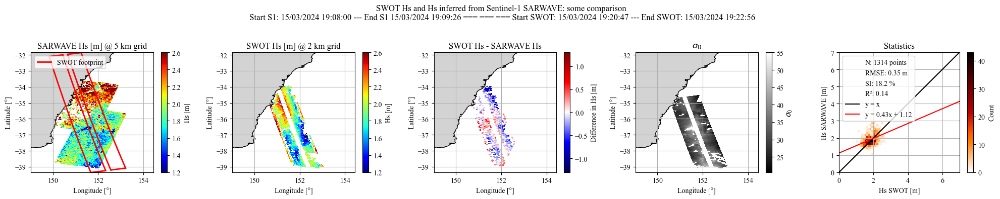

 42%|████▏     | 72/170 [35:19<51:43, 31.67s/it]

lon_map_min = -11.306388; lon_map_max = -4.3785973; lat_map_min = 57.4825, lat_map_max = 64.37076


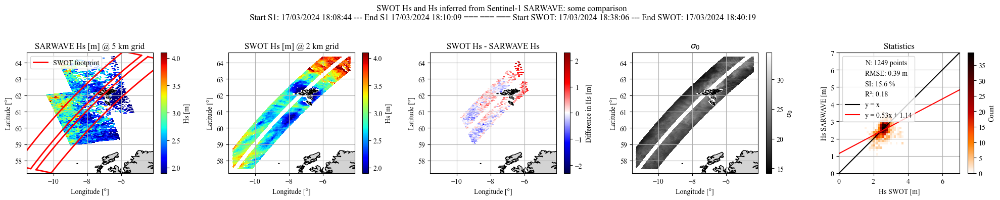

 44%|████▎     | 74/170 [36:59<56:42, 35.44s/it]

lon_map_min = 9.24871; lon_map_max = 18.698792; lat_map_min = 67.864426, lat_map_max = 72.660286


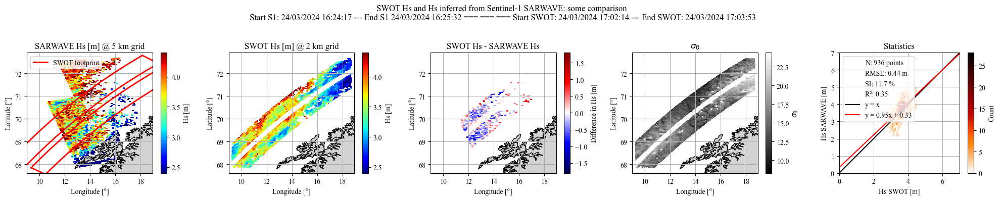

 45%|████▍     | 76/170 [38:24<58:04, 37.07s/it]

lon_map_min = 11.351855; lon_map_max = 20.9863; lat_map_min = 71.097206, lat_map_max = 74.62562


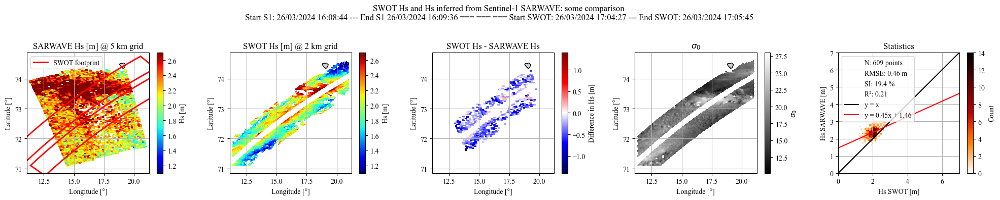

 45%|████▌     | 77/170 [39:47<1:07:21, 43.46s/it]

lon_map_min = -1.3621556; lon_map_max = 7.162125; lat_map_min = 52.866688, lat_map_max = 65.01581


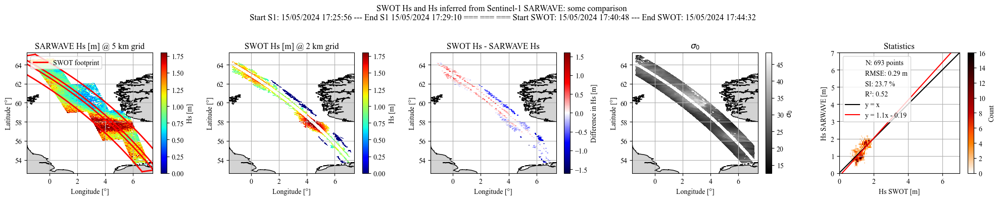

 50%|█████     | 85/170 [41:17<33:30, 23.65s/it]  

lon_map_min = 170.63527; lon_map_max = 178.36783; lat_map_min = 51.01363, lat_map_max = 62.676987


/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:119: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im0 = ax[0].pcolormesh(x_grid, y_grid, hsml_confident, cmap="jet", vmin=hs_min, vmax=hs_max)
/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:160: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im2 = ax[2].pcolormesh(x_grid, y_grid, hs_swot_on_iw-hsml_confident, cmap="seismic", vmin=-diff_max, vmax=diff_max)


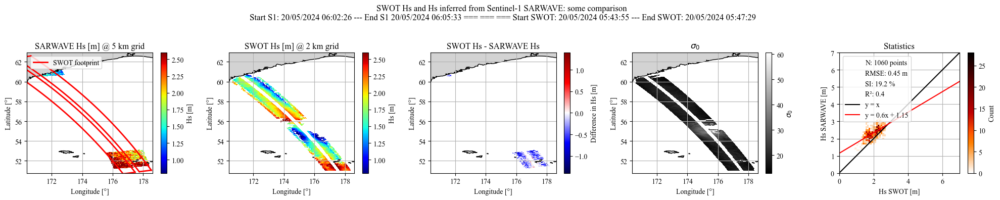

 53%|█████▎    | 90/170 [42:34<27:40, 20.76s/it]

lon_map_min = 33.145073; lon_map_max = 37.177223; lat_map_min = -27.528706, lat_map_max = -20.628317


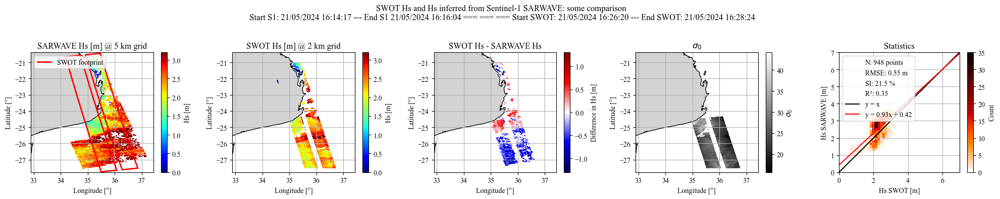

 55%|█████▌    | 94/170 [43:54<26:01, 20.54s/it]

lon_map_min = -36.634834; lon_map_max = -23.382692; lat_map_min = -6.575727, lat_map_max = 44.431755


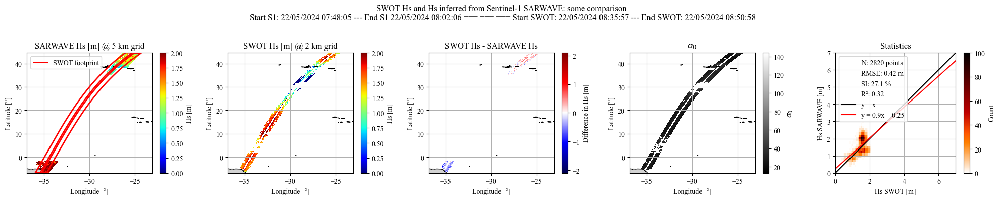

 57%|█████▋    | 97/170 [46:37<34:40, 28.50s/it]

lon_map_min = -175.54828; lon_map_max = -172.48907; lat_map_min = -20.906221, lat_map_max = -17.153727


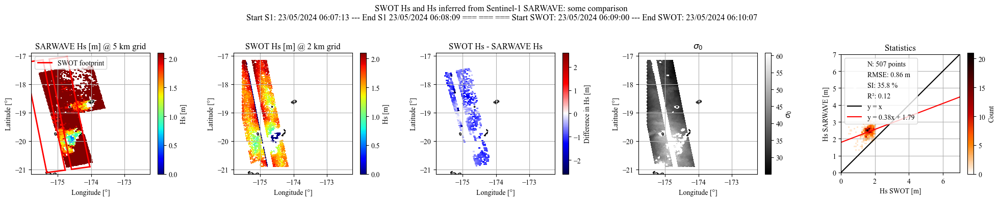

 58%|█████▊    | 98/170 [47:53<40:00, 33.34s/it]

lon_map_min = -11.04686; lon_map_max = 1.2122941; lat_map_min = 28.75, lat_map_max = 62.064552


/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:119: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im0 = ax[0].pcolormesh(x_grid, y_grid, hsml_confident, cmap="jet", vmin=hs_min, vmax=hs_max)
/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:160: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im2 = ax[2].pcolormesh(x_grid, y_grid, hs_swot_on_iw-hsml_confident, cmap="seismic", vmin=-diff_max, vmax=diff_max)


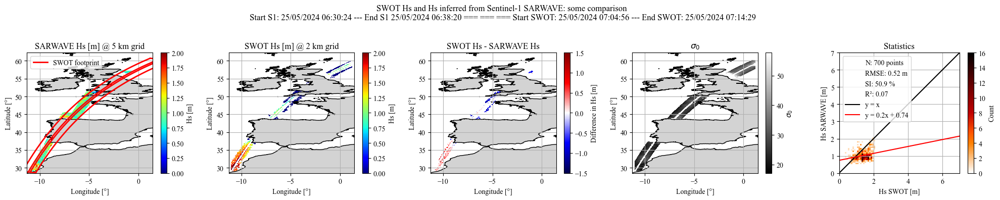

 59%|█████▉    | 101/170 [49:48<40:03, 34.83s/it]

lon_map_min = -48.297005; lon_map_max = -44.624664; lat_map_min = -27.681639, lat_map_max = -22.656109


/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:119: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im0 = ax[0].pcolormesh(x_grid, y_grid, hsml_confident, cmap="jet", vmin=hs_min, vmax=hs_max)
/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:160: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im2 = ax[2].pcolormesh(x_grid, y_grid, hs_swot_on_iw-hsml_confident, cmap="seismic", vmin=-diff_max, vmax=diff_max)


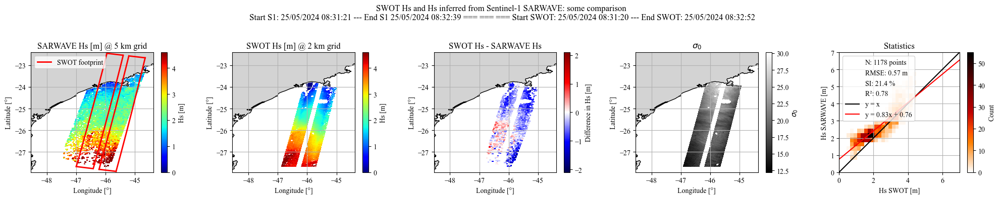

 60%|██████    | 102/170 [51:05<45:24, 40.07s/it]

lon_map_min = -11.95798; lon_map_max = -3.9824514; lat_map_min = 53.071796, lat_map_max = 63.84269


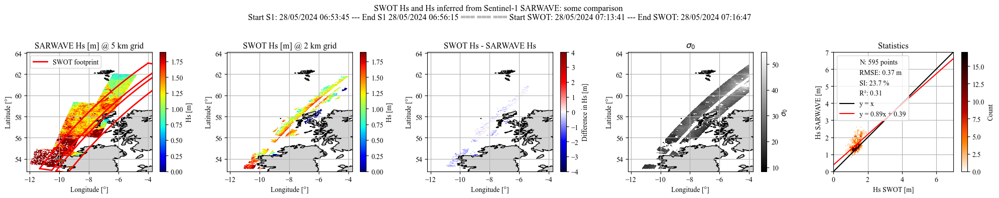

 63%|██████▎   | 107/170 [52:29<30:33, 29.11s/it]

lon_map_min = 5.543768; lon_map_max = 14.369772; lat_map_min = 72.13416, lat_map_max = 74.15542


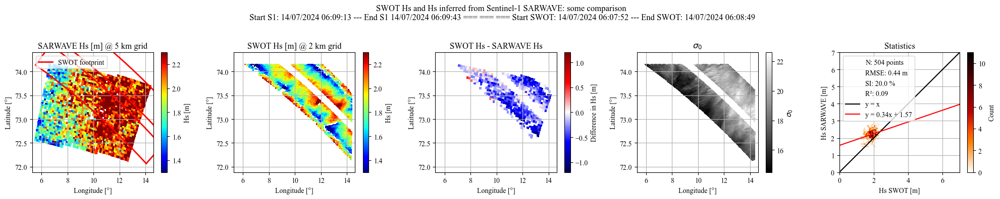

 68%|██████▊   | 115/170 [53:45<17:18, 18.87s/it]

lon_map_min = -172.73187; lon_map_max = -164.32542; lat_map_min = 65.24145, lat_map_max = 70.282684


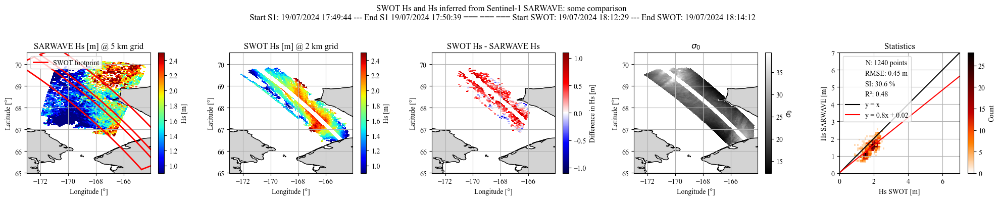

 70%|███████   | 119/170 [55:03<16:13, 19.10s/it]

lon_map_min = -2.2460103; lon_map_max = 6.956366; lat_map_min = 64.56802, lat_map_max = 70.91329


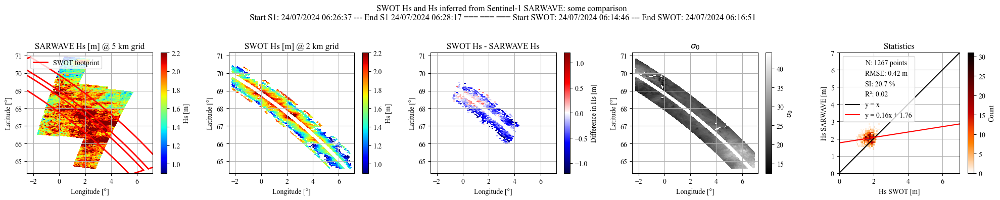

 71%|███████   | 121/170 [56:26<18:33, 22.72s/it]

lon_map_min = -6.301307; lon_map_max = 0.8481213; lat_map_min = 58.64349, lat_map_max = 65.14102


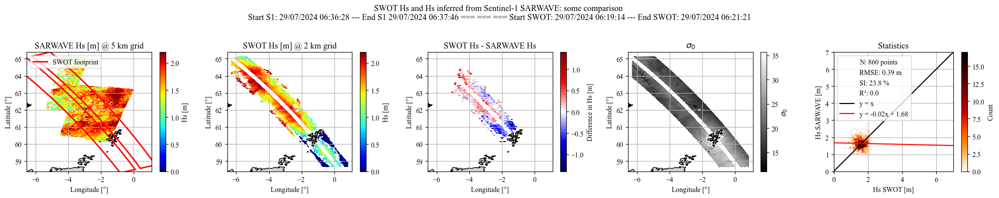

 72%|███████▏  | 123/170 [57:49<20:32, 26.23s/it]

lon_map_min = 170.81639; lon_map_max = 175.61171; lat_map_min = -40.72998, lat_map_max = -34.15318


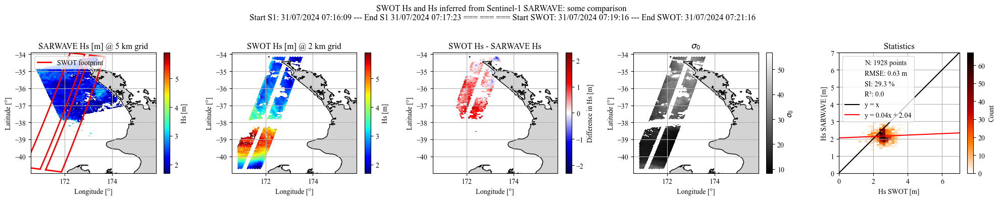

 75%|███████▌  | 128/170 [59:23<16:16, 23.26s/it]

lon_map_min = -7.7577744; lon_map_max = -4.6401486; lat_map_min = 0.13752486, lat_map_max = 5.3363833


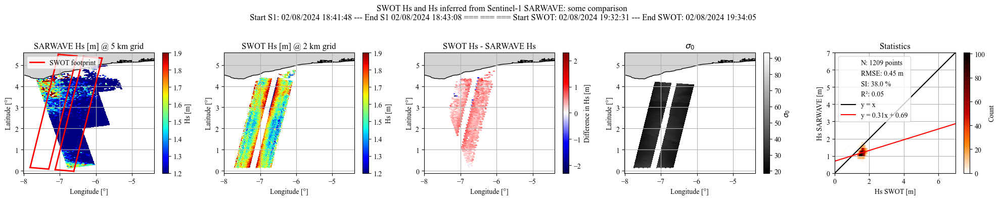

 76%|███████▋  | 130/170 [1:00:42<17:30, 26.26s/it]

lon_map_min = 113.149826; lon_map_max = 117.55288; lat_map_min = -34.23721, lat_map_max = -27.33354


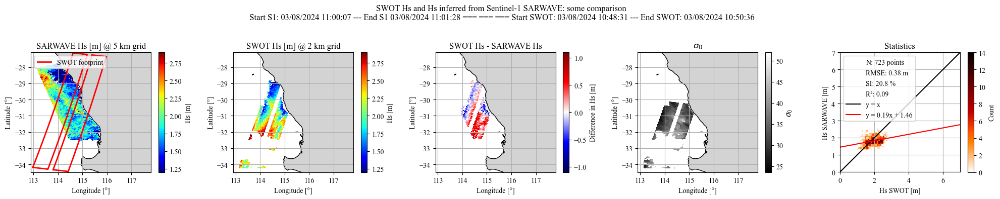

 77%|███████▋  | 131/170 [1:02:14<22:05, 33.99s/it]

lon_map_min = -160.75601; lon_map_max = -157.88206; lat_map_min = 20.519014, lat_map_max = 23.439314


/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:119: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im0 = ax[0].pcolormesh(x_grid, y_grid, hsml_confident, cmap="jet", vmin=hs_min, vmax=hs_max)
/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:160: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im2 = ax[2].pcolormesh(x_grid, y_grid, hs_swot_on_iw-hsml_confident, cmap="seismic", vmin=-diff_max, vmax=diff_max)


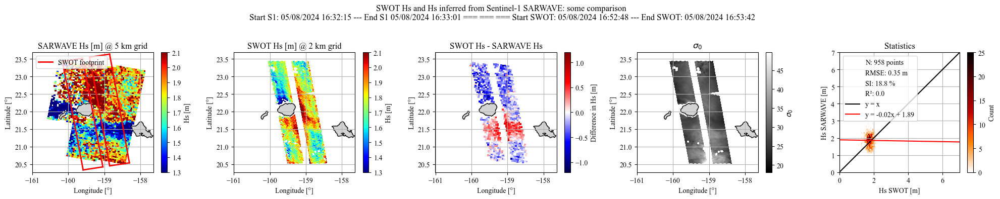

 79%|███████▉  | 135/170 [1:03:42<17:01, 29.20s/it]

lon_map_min = -15.176634; lon_map_max = -11.129179; lat_map_min = 1.6677556, lat_map_max = 11.357291


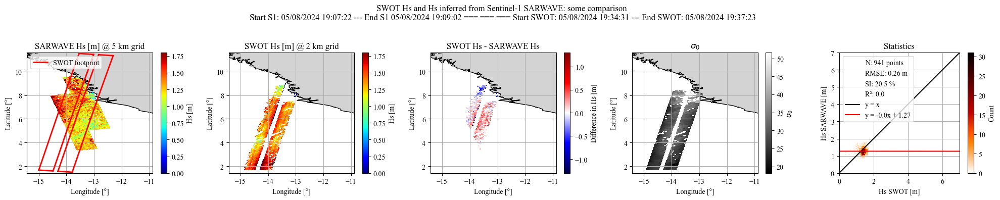

 80%|████████  | 136/170 [1:05:12<20:49, 36.76s/it]

lon_map_min = 18.462368; lon_map_max = 22.164375; lat_map_min = -37.73498, lat_map_max = -33.932163


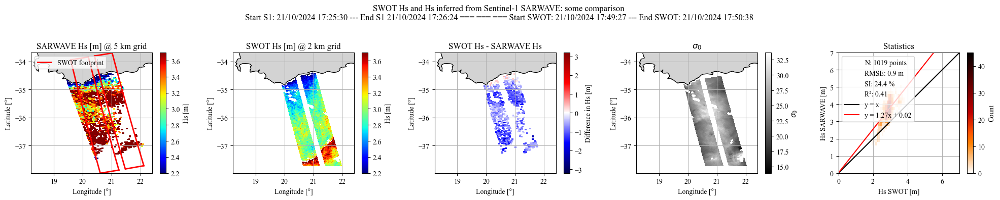

 81%|████████  | 138/170 [1:06:36<20:23, 38.22s/it]

lon_map_min = -0.0731022; lon_map_max = 11.065673; lat_map_min = 58.834126, lat_map_max = 71.059906


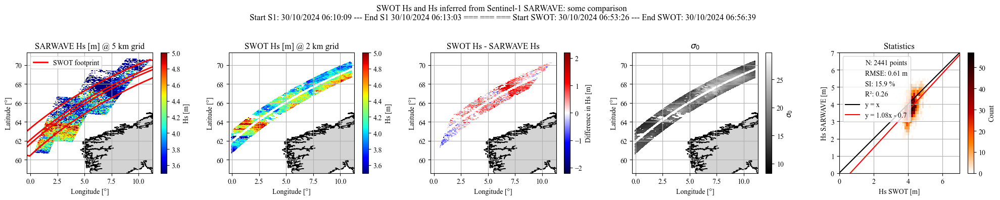

 82%|████████▏ | 139/170 [1:08:02<23:37, 45.74s/it]

lon_map_min = 0.38085082; lon_map_max = 7.8189907; lat_map_min = 60.308838, lat_map_max = 66.643936


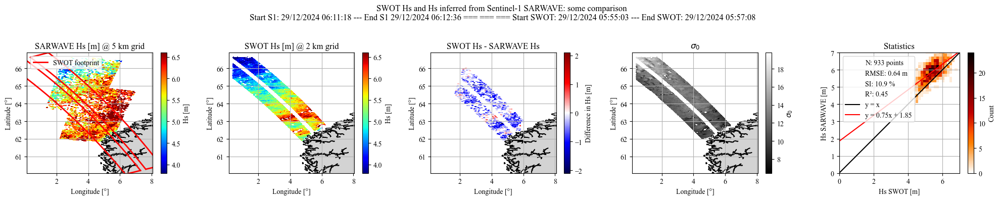

 87%|████████▋ | 148/170 [1:09:20<07:39, 20.88s/it]

lon_map_min = 2.2776928; lon_map_max = 8.657193; lat_map_min = 52.57568, lat_map_max = 60.3895


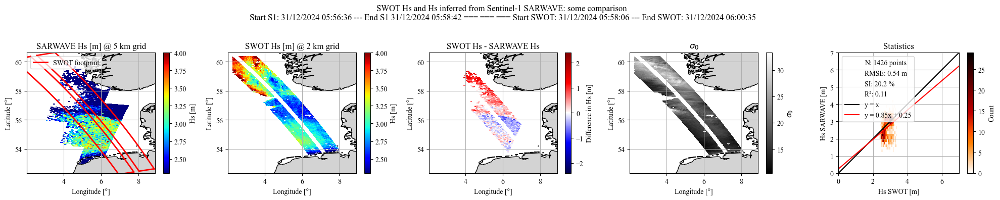

 89%|████████▉ | 151/170 [1:10:41<07:04, 22.34s/it]

lon_map_min = -75.35336; lon_map_max = -72.350334; lat_map_min = -18.407488, lat_map_max = -14.652505


/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:119: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im0 = ax[0].pcolormesh(x_grid, y_grid, hsml_confident, cmap="jet", vmin=hs_min, vmax=hs_max)
/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:160: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im2 = ax[2].pcolormesh(x_grid, y_grid, hs_swot_on_iw-hsml_confident, cmap="seismic", vmin=-diff_max, vmax=diff_max)


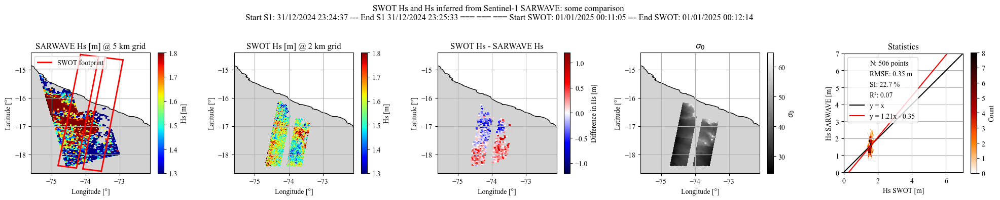

 90%|█████████ | 153/170 [1:12:01<07:16, 25.66s/it]

lon_map_min = -155.28581; lon_map_max = -149.64644; lat_map_min = 55.782578, lat_map_max = 60.634834


/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:119: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im0 = ax[0].pcolormesh(x_grid, y_grid, hsml_confident, cmap="jet", vmin=hs_min, vmax=hs_max)
/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:119: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  im0 = ax[0].pcolormesh(x_grid, y_grid, hsml_confident, cmap="jet", vmin=hs_min, vmax=hs_max)
/dev/shm/pbs.3818094.datarmor0/ipykernel_17409/1752849204.py:160: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically incr

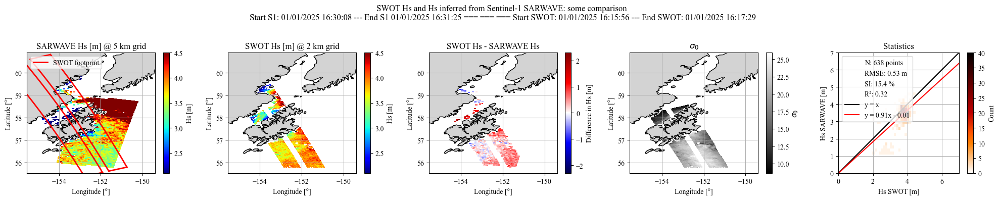

 91%|█████████ | 154/170 [1:14:02<09:50, 36.89s/it]

lon_map_min = -77.02663; lon_map_max = -73.9467; lat_map_min = 28.16759, lat_map_max = 31.632898


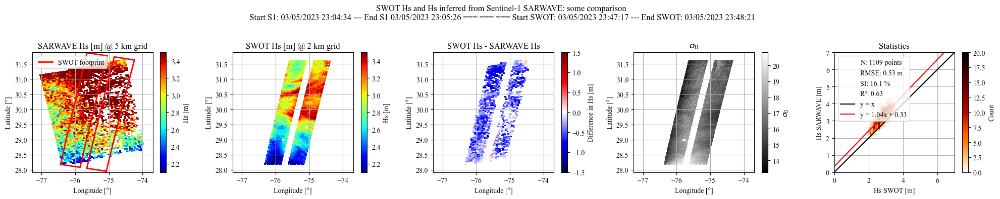

 95%|█████████▌| 162/170 [1:15:17<02:49, 21.13s/it]

lon_map_min = -15.93716; lon_map_max = -10.705045; lat_map_min = 58.166, lat_map_max = 61.27753


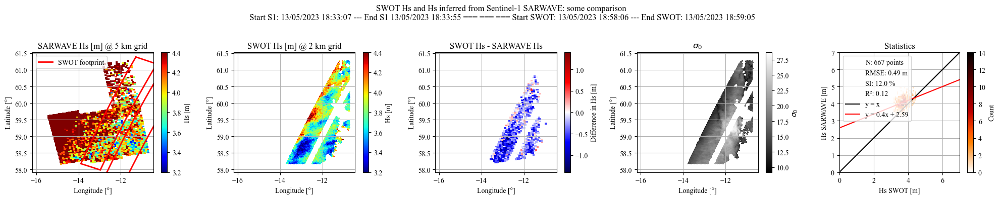

 98%|█████████▊| 166/170 [1:16:34<01:22, 20.55s/it]

lon_map_min = -12.80921; lon_map_max = -7.368794; lat_map_min = 60.69968, lat_map_max = 63.32592


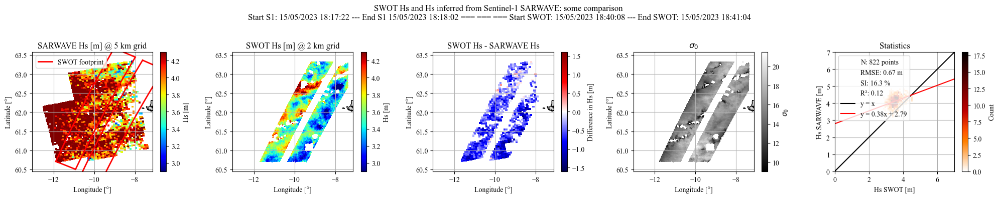

 98%|█████████▊| 167/170 [1:17:49<01:17, 25.73s/it]

lon_map_min = 7.8373985; lon_map_max = 17.16738; lat_map_min = 70.759796, lat_map_max = 74.12189


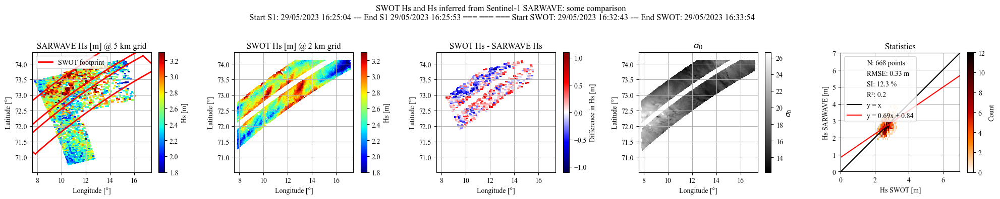

100%|██████████| 170/170 [1:19:08<00:00, 27.93s/it]


In [4]:
# Removing close to zero values
df_hs_iw = pd.read_csv("G_df/df_hs_with_iw_files.csv")
# Removing close to zero values
df_hs_iw = df_hs_iw.loc[df_hs_iw["hs_swot_on_iw"] >= 0.3]
conf_rate_min = -0.5
df_hs_iw = df_hs_iw.loc[df_hs_iw["conf_iw"] >= conf_rate_min]



for swot_file in tqdm(np.unique(df_hs_iw["swot_file"])):
    df_hs_swot_i = df_hs_iw.loc[df_hs_iw["swot_file"] == swot_file]
    
    all_hs_swot = df_hs_swot_i["hs_swot_on_iw"].values
    all_hs_iw = df_hs_swot_i["hsml_iw"].values
    
    
    x_obs, y_obs = all_hs_swot, all_hs_iw
    #y_obs_2 = MEAN_HSML_CONFIDENT_clean
    
    #plt.scatter(x_obs, y_obs, color="red", marker = "x")
    #plt.scatter(x_obs, y_obs_2, color="green", marker = "x")
    
    
    
    
    x_id, y_id = np.arange(0, 8, 0.1), np.arange(0, 8, 0.1)
    

    
    coeffs = np.polyfit(x_obs.flatten(), y_obs.flatten(), deg=1) 
    a, b = coeffs[0], coeffs[1]


    RMSE = round(np.sqrt(np.mean((x_obs-y_obs)**2)),2)

    y_pred = a*x_obs+b
    R2 = round(1 - np.sum((y_obs - y_pred)**2) / np.sum((y_obs - np.mean(y_obs))**2), 2)

    N = x_obs.shape[0]

    SI = round(100* RMSE / np.mean(y_obs), 1)
    



    N_threshold = 500

    if N >= N_threshold:


        
        ####################
        ### LOADING SWOT ###
        ####################
    
        lon_map_min, lon_map_max, lat_map_min, lat_map_max = df_hs_swot_i["lon_map_min"].values[0], df_hs_swot_i["lon_map_max"].values[0], df_hs_swot_i["lat_map_min"].values[0], df_hs_swot_i["lat_map_max"].values[0]
        
        ### Launching ###
        ds_swot = xr.open_dataset(swot_file)
        try:
            ds_swot, t_ini_swot_formatted, t_end_swot_formatted = st.format_ds_swot(ds_swot, lon_map_min, lon_map_max, lat_map_min, lat_map_max, untrustable_hs=40, kernel_size_nan=1, step_to_crop_at_edges=2)
        except ValueError: # ça arrive quand le fichier swot est corrompu et qu'il y a des nan partout
            continue # on va au swot file d'après

            
        min_xx, max_xx = 100, -1 # on initialise ainsi pour que ça se mette bien

        try:
            min_iw_i, max_iw_i = np.nanmin([np.nanmin(x_obs), np.nanmin(y_obs)]),  np.nanmax([np.nanmax(x_obs), np.nanmax(y_obs)])
            if min_iw_i < min_xx:
                min_xx = min_iw_i
            if max_iw_i > max_xx:
                max_xx = max_iw_i
        except ValueError:
            pass
            
        print(f"lon_map_min = {lon_map_min}; lon_map_max = {lon_map_max}; lat_map_min = {lat_map_min}, lat_map_max = {lat_map_max}")
        lon_swot = ds_swot.longitude.values
        lat_swot = ds_swot.latitude.values
        hs_swot = ds_swot.swh_karin.values
        sig0_swot = ds_swot.sig0_karin.values
    
        # Estimation des bornes de la colorbar
        hs_max = round(np.nanpercentile(ds_swot.swh_karin.values,99),1)
        hs_min = round(np.nanpercentile(ds_swot.swh_karin.values,1),1)
        try:
            cmap_levels = np.arange(hs_min,hs_max,0.05)
        except ValueError:
            continue 

        fig, ax = plt.subplots(1,5,figsize=(20,4))

    
        ### Maintenant on interpole
        points = np.concatenate((lon_swot.flatten().reshape(-1,1), lat_swot.flatten().reshape(-1,1)),axis=1) # shape (n, 2): coordonnées de SWOT 
    
        diff_max = 0

        dt_ini_min =  datetime.strptime("20310927T163757", "%Y%m%dT%H%M%S") # 2031 pour être sûr qu'il sera jamais pris en date de début
        dt_end_max =  datetime.strptime("20010927T163857", "%Y%m%dT%H%M%S") # 2001 pour être sûr qu'il sera jamais pris en date de fin
        
        for iw_file in np.unique(df_hs_swot_i["iw_file"]):
            ds = xr.open_dataset(iw_file, group='intraburst')
            # On récupère la grille lon, lat de l'iw
            x_grid, y_grid = ds.variables["longitude"].values, ds.variables["latitude"].values
    
            #interpolated_values_on_grid = griddata(points, values, (grid_x, grid_y), method='linear') # ligne de code pour se rappeler comment ça marche
            hs_swot_on_iw = griddata(points, hs_swot.flatten(), (x_grid, y_grid), method='linear')
    
            hsml = ds.variables["hs_most_likely"].values
    
            hs_conf = ds.variables["hs_conf"].values
            mask_confident = hs_conf > conf_rate_min # hs_conf [-1,1] so 0 is 50%-50%
            hsml_confident = np.ones(hsml.shape)*np.nan
            hsml_confident[mask_confident] = hsml[mask_confident]

            try:
                #ax[0].pcolormesh(x_grid, y_grid, hsml, cmap="jet", vmin=hs_min, vmax=hs_max, alpha=0.75) # on ajoute tout 
                im0 = ax[0].pcolormesh(x_grid, y_grid, hsml_confident, cmap="jet", vmin=hs_min, vmax=hs_max)
            except ValueError:
                continue

            try:
                diff = round(np.nanmax(np.abs(hsml - hs_swot_on_iw)),1)
                if diff > diff_max:
                    diff_max = diff
            except ValueError:
                pass

            str_ini, str_end = hand_back_times_from_IW_filepath(iw_file)
            
            dt_ini = datetime.strptime(str_ini, "%Y%m%dT%H%M%S")
            if dt_ini < dt_ini_min:
                dt_ini_min = dt_ini
        
            dt_end = datetime.strptime(str_end, "%Y%m%dT%H%M%S")
            if dt_end > dt_end_max:
                dt_end_max = dt_end

                
        for iw_file in np.unique(df_hs_swot_i["iw_file"]):
            ds = xr.open_dataset(iw_file, group='intraburst')
            # On récupère la grille lon, lat de l'iw
            x_grid, y_grid = ds.variables["longitude"].values, ds.variables["latitude"].values
    
            #interpolated_values_on_grid = griddata(points, values, (grid_x, grid_y), method='linear') # ligne de code pour se rappeler comment ça marche
            hs_swot_on_iw = griddata(points, hs_swot.flatten(), (x_grid, y_grid), method='linear')
    
            hsml = ds.variables["hs_most_likely"].values
    
            hs_conf = ds.variables["hs_conf"].values
            mask_confident = hs_conf > conf_rate_min # hs_conf [-1,1] so 0 is 50%-50%
            hsml_confident = np.ones(hsml.shape)*np.nan
            hsml_confident[mask_confident] = hsml[mask_confident]
    
            
    
            try:
                #ax[2].pcolormesh(x_grid, y_grid, hs_swot_on_iw-hsml, cmap="seismic", vmin=-diff_max, vmax=diff_max, alpha=0.75)
                im2 = ax[2].pcolormesh(x_grid, y_grid, hs_swot_on_iw-hsml_confident, cmap="seismic", vmin=-diff_max, vmax=diff_max)
            except ValueError:
                continue


        im1 = ax[1].pcolormesh(lon_swot, lat_swot, hs_swot, shading='auto', cmap='jet', vmin=hs_min, vmax=hs_max)

        im3 = ax[3].pcolormesh(lon_swot, lat_swot, sig0_swot, shading='auto', cmap='gray')

        _, _, _, im4 = ax[4].hist2d(x_obs, y_obs, bins=20, cmap='gist_heat_r')

        ax[4].scatter(-1,-1, color="white", label=f"N: {N} points")    
        ax[4].scatter(-1,-1, color="white", label=f"RMSE: {RMSE} m")
        ax[4].scatter(-1,-1, color="white", label=f"SI: {SI} %")
        ax[4].scatter(-1,-1, color="white", label=f"R²: {R2}")    

        ax[4].plot(x_id, y_id, color="black", label="y = x")
    
        if b > 0:
            ax[4].plot(x_id, a*x_id+b,color="red",label=f"y = {round(a,2)}x + {round(b,2)}")
        else: 
            ax[4].plot(x_id, a*x_id+b,color="red",label=f"y = {round(a,2)}x - {round(abs(b),2)}")

        ax[4].set_xlabel("Hs SWOT [m]")
        ax[4].set_ylabel("Hs SARWAVE [m]")
        ax[4].axis('scaled')
        ax[4].legend(loc="upper left")
        ax[4].grid()

        sf_world = shp.Reader(r"data/shapefiles/ne_10m_coastline/ne_10m_coastline.shp") 




        
        ax[0].set_title("SARWAVE Hs [m] @ 5 km grid")
        st.plot_swot_footprint(ds_swot, ax=ax[0], lw=2)
        fig.colorbar(im0, ax=ax[0], orientation='vertical', label = "Hs [m]")
        ax[0].legend(loc="upper left")

        
        ax[1].set_title("SWOT Hs [m] @ 2 km grid")
        fig.colorbar(im1, ax=ax[1], orientation='vertical', label = "Hs [m]")
        
        ax[2].set_title("SWOT Hs - SARWAVE Hs")
        fig.colorbar(im2, ax=ax[2], orientation='vertical', label = "Difference in Hs [m]")

        ax[3].set_title(r"$\sigma _0$")
        fig.colorbar(im3, ax=ax[3], orientation='vertical', label = r"$\sigma _0$")
        
        ax[4].set_title("Statistics")
        #ax[4].set_xlim(min_xx, max_xx)
        #ax[4].set_ylim(min_xx, max_xx)
        ax[4].set_xlim(0, 7)
        ax[4].set_ylim(0, 7)
        fig.colorbar(im4, ax=ax[4], orientation='vertical', label = "Count")
    
        step_deg = 0.25
        for k in range(4):
            ax[k].set_xlim(lon_map_min-step_deg, lon_map_max+step_deg)
            ax[k].set_ylim(lat_map_min-step_deg, lat_map_max+step_deg)
            ax[k].grid()
            ax[k].set_xlabel("Longitude [°]")
            ax[k].set_ylabel("Latitude [°]")
            st.show_shp(ax[k],sf_world, zorder=0, color='lightgrey')

        
        fig.suptitle("SWOT Hs and Hs inferred from Sentinel-1 SARWAVE: some comparison \n Start S1: {} --- End S1 {} === === === Start SWOT: {} --- End SWOT: {} \n".format(dt_ini_min.strftime('%d/%m/%Y %H:%M:%S'), dt_end_max.strftime('%d/%m/%Y %H:%M:%S'), t_ini_swot_formatted, t_end_swot_formatted), x=0.5)
        #fig.suptitle("SWOT Hs and Hs inferred from Sentinel-1 SARWAVE: some comparison \n Start SWOT: {} --- End SWOT: {}".format(t_ini_swot_formatted, t_end_swot_formatted), x=0.55)
        fig.tight_layout()
        plt.show()
        

    